In [1]:
import pystac
import stackstac
import geopandas as gpd
import hvplot.xarray
from dask.distributed import Client
import rioxarray
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from datetime import datetime
import copy
import matplotlib
import matplotlib.dates as mdates
import numpy.ma as ma
import rasterio
from rasterio import plot
import xarray as xr
import rioxarray as rxr

In [2]:
# MODIFY PARAMETERS

#-------------------------------------------------------------------------
# comment ONE of these out at a time
relative_orbit_number = 137 # change to get any particular relative orbit
#orbit_direction = 'ascending' # 'ascending', descending', 'all'
#-------------------------------------------------------------------------
# define time slice
today = datetime.today().strftime('%Y-%m-%d')
time_slice = slice('2020-01-01','2020-12-31') # All of 2020
#time_slice = slice('2017-01-01',today)
#-------------------------------------------------------------------------
# what months are represented with colors
time_slice_display = slice('2020-02-01','2020-7-31')
#-------------------------------------------------------------------------
polarization ='gamma0_vv'
#-------------------------------------------------------------------------
bounding_box_gf = gpd.read_file('shapefiles/mt_rainier.geojson')
#-------------------------------------------------------------------------
rainier_glaciers = gpd.read_file('shapefiles/rainier_glaciers.geojson')
#-------------------------------------------------------------------------
shapefile_clip = True

In [3]:
if 'relative_orbit_number' in locals():
    by_orbit = True
else: 
    by_orbit = False
if shapefile_clip == True:
    shapefile_clip_status = 'clipped'
else:
    shapefile_clip_status = ''

In [4]:
# GDAL environment variables for better performance
os.environ['AWS_REGION']='us-west-2'
os.environ['GDAL_DISABLE_READDIR_ON_OPEN']='EMPTY_DIR' 
os.environ['AWS_NO_SIGN_REQUEST']='YES' 

In [5]:
# Paste /proxy/localhost:8787 for cluster diagnostics
client = Client(local_directory='/tmp', processes=False)

/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/distributed/node.py:160: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 44029 instead
  warnings.warn(


In [6]:
# Load STAC ItemCollection
stac_items = pystac.ItemCollection.from_file('mycollection.json')
items = [item.to_dict(transform_hrefs=False) for item in stac_items]

stack = stackstac.stack(items,
                        dtype='float32')

In [7]:
# import bounding box
bounding_box_utm_gf = bounding_box_gf.to_crs(stack.crs)
xmin, ymax, xmax, ymin = bounding_box_utm_gf.bounds.values[0]
rainier_glaciers = rainier_glaciers.to_crs(stack.crs)

In [8]:
# filter scenes
scenes = stack.sel(band=polarization).sel(x=slice(xmin,xmax),y=slice(ymin,ymax)).sel(time=time_slice)

In [9]:
# filter by orbit direction or orbit number
if by_orbit:
    scenes = scenes.where(scenes.coords['sat:relative_orbit']==relative_orbit_number,drop=True)
    orbit_directions = scenes.coords['sat:orbit_state']
    orbit_direction = orbit_directions[0].values
elif orbit_direction == 'all':
    scenes = scenes
else:
    scenes = scenes.where(scenes.coords['sat:orbit_state']==orbit_direction,drop=True)

In [10]:
%%time
# compute frames, drop missing data
frames_all = scenes.compute()
frames = frames_all.dropna('time',how='all')

CPU times: user 2.59 s, sys: 381 ms, total: 2.97 s
Wall time: 2.42 s


In [11]:
frames

<xarray.DataArray 'stackstac-78772d084bec799abdc54e816504f70b' (time: 30, y: 861, x: 889)>
array([[[0.06092138, 0.07842246, 0.10888778, ..., 0.14245178,
         0.14444616, 0.15678786],
        [0.06960836, 0.08434761, 0.10756292, ..., 0.14272152,
         0.15157174, 0.16821061],
        [0.09168366, 0.10077754, 0.11436325, ..., 0.13857241,
         0.14965294, 0.1751858 ],
        ...,
        [0.133102  , 0.14000052, 0.14343636, ..., 0.13619123,
         0.08741901, 0.08548959],
        [0.13985892, 0.15638548, 0.16881832, ..., 0.11032844,
         0.08143949, 0.08085477],
        [0.1346154 , 0.15282935, 0.16619849, ..., 0.10198613,
         0.09002755, 0.09300289]],

       [[0.12292084, 0.13406159, 0.14815691, ..., 0.16547564,
         0.16222988, 0.18635063],
        [0.11115985, 0.11928032, 0.13363183, ..., 0.17162842,
         0.1880643 , 0.25015962],
        [0.09182425, 0.09374177, 0.10866652, ..., 0.2032393 ,
         0.23855981, 0.31064746],
...
        [0.09947052, 0.09827235, 0.08813787, ..., 0.14554083,
         0.11929655, 0.08555809],
        [0.09628317, 0.09948327, 0.09868646, ..., 0.12698808,
         0.09082607, 0.06704047],
        [0.10268524, 0.10808401, 0.1175536 , ..., 0.11921594,
         0.08330268, 0.08064944]],

       [[0.05336327, 0.06090354, 0.10302839, ..., 0.22223382,
         0.22242466, 0.22393374],
        [0.0632269 , 0.06630295, 0.09277037, ..., 0.19427632,
         0.21205023, 0.24649338],
        [0.08078043, 0.07348134, 0.0876061 , ..., 0.16672802,
         0.18869892, 0.2428008 ],
        ...,
        [0.13954163, 0.13883683, 0.12944482, ..., 0.18600461,
         0.15541163, 0.11399283],
        [0.13395551, 0.13318409, 0.12150447, ..., 0.16026609,
         0.13876086, 0.10855076],
        [0.14482214, 0.15025683, 0.14838594, ..., 0.14490004,
         0.13828194, 0.12152594]]], dtype=float32)
Coordinates:
  * time                         (time) datetime64[ns] 2020-01-11T02:01:19 .....
    id                           (time) <U22 'S1B_20200111_10TES_ASC' ... 'S1...
    band                         <U9 'gamma0_vv'
  * x                            (x) float64 5.858e+05 5.858e+05 ... 6.036e+05
  * y                            (y) float64 5.2e+06 5.2e+06 ... 5.183e+06
    sar:resolution_azimuth       float64 22.6
    end_datetime                 (time) <U20 '2020-01-11T02:01:44Z' ... '2020...
    sar:looks_equivalent_number  float64 4.3
    sar:frequency_band           <U1 'C'
    sar:instrument_mode          <U2 'IW'
    sar:resolution_range         float64 20.3
    gsd                          int64 20
    proj:epsg                    int64 32610
    sar:pixel_spacing_range      int64 10
    sat:relative_orbit           (time) int64 137 137 137 137 ... 137 137 137
    sar:looks_range              int64 5
    proj:transform               object {0.0, 1.0, -20.0, 499980.0, 5200020.0...
    constellation                <U10 'sentinel-1'
    sar:looks_azimuth            int64 1
    sar:polarizations            object {'VV', 'VH'}
    sat:orbit_state              (time) <U10 'ascending' ... 'ascending'
    sar:observation_direction    <U5 'right'
    proj:shape                   object {5490}
    created                      (time) <U27 '2021-11-29T19:17:40.149225Z' .....
    mgrs:grid_square             <U2 'ES'
    instruments                  <U5 'c-sar'
    sentinel:product_ids         (time) object ['S1B_IW_GRDH_1SDV_20200111T02...
    start_datetime               (time) <U20 '2020-01-11T02:00:55Z' ... '2020...
    sar:center_frequency         float64 5.405
    sar:product_type             <U3 'RTC'
    platform                     (time) <U11 'sentinel-1b' ... 'sentinel-1b'
    mgrs:utm_zone                <U2 '10'
    sat:absolute_orbit           (time) int64 19763 19938 20113 ... 24663 24838
    sar:pixel_spacing_azimuth    int64 10
    mgrs:latitude_band           <U1 'T'
    sentinel:mgrs                <U5 '10TES'
    title                        <U21 'Gamma0 VV backscatter'
   

In [12]:
mins_info_runoff = frames.argmin(dim='time',skipna=False)
mins_info_ripening = frames.differentiate(coord='time',datetime_unit='W').argmin(dim='time',skipna=False) # dt=week
runoff_dates = frames[mins_info_runoff].time
ripening_dates = frames[mins_info_ripening].time
runoff_dates = runoff_dates.rio.write_crs(stack.crs)
ripening_dates = ripening_dates.rio.write_crs(stack.crs)

In [13]:
data_cube = xr.concat([frames[mins_info_runoff], frames[mins_info_ripening]], "z")

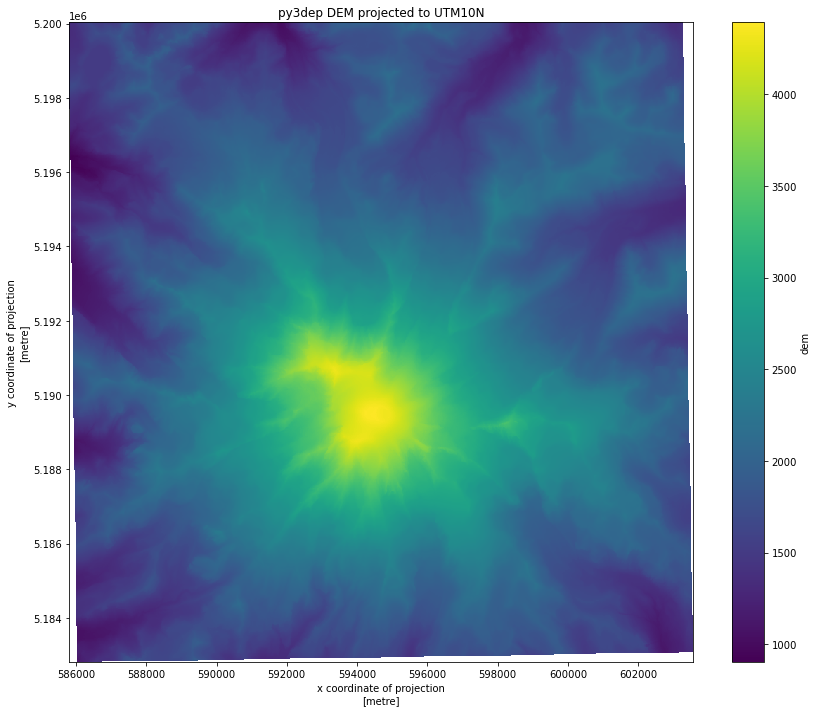

In [14]:
dem = rxr.open_rasterio('dem/dem_rainier_py3dep.tif',masked=True)
dem_projected = dem.rio.reproject_match(data_cube)
f,ax=plt.subplots(figsize=(12,10))
dem_projected.plot(ax=ax)
ax.set_title('py3dep DEM projected to UTM10N')
plt.tight_layout()

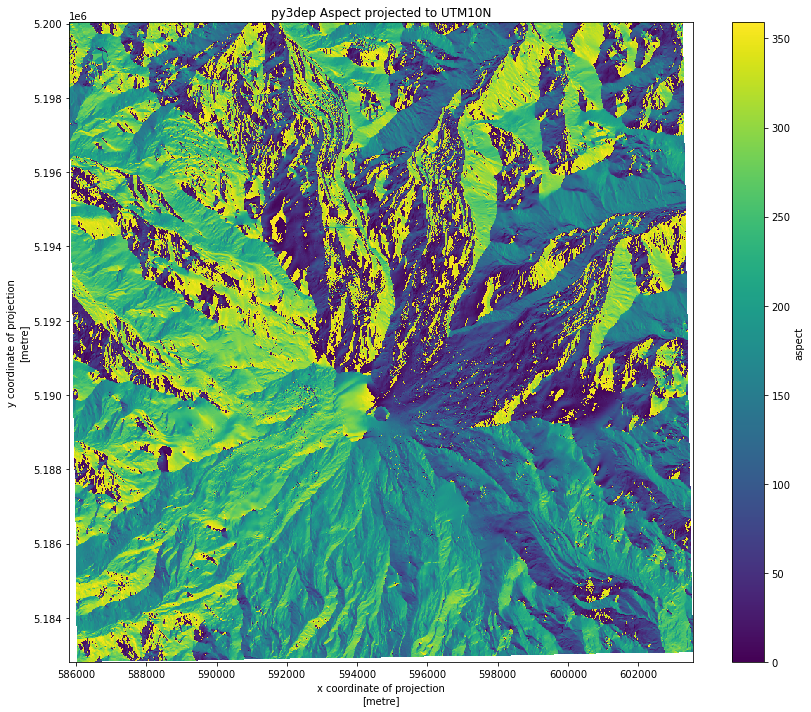

In [15]:
aspect = rxr.open_rasterio('dem/aspect_rainier_py3dep.tif',masked=True)
aspect_projected = aspect.rio.reproject_match(data_cube)
f,ax=plt.subplots(figsize=(12,10))
aspect_projected.plot(vmin=0,vmax=359)
ax.set_title('py3dep Aspect projected to UTM10N')
plt.tight_layout()

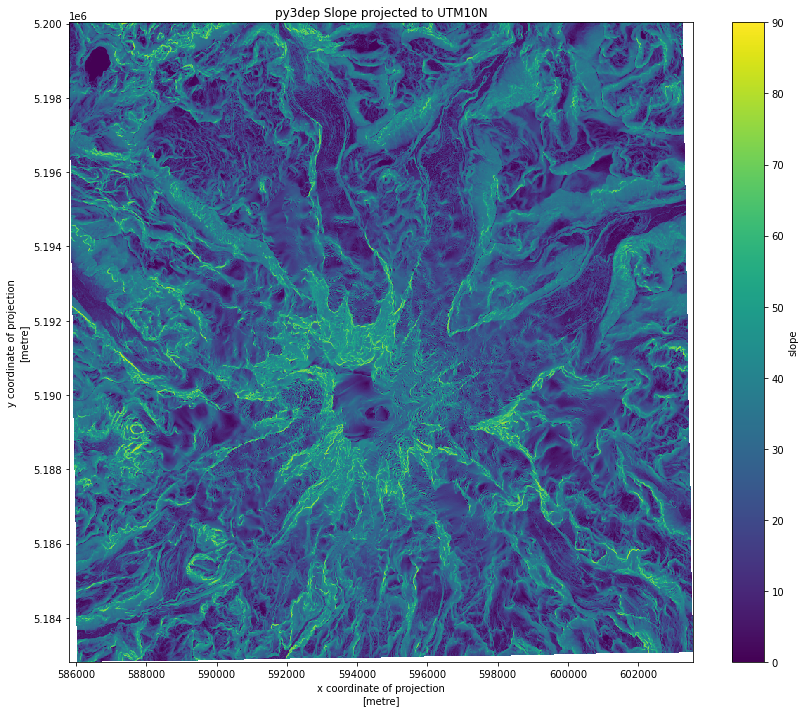

In [16]:
slope = rxr.open_rasterio('dem/slope_rainier_py3dep.tif',masked=True)
slope_projected = slope.rio.reproject_match(data_cube)
f,ax=plt.subplots(figsize=(12,10))
slope_projected.plot(vmin=0,vmax=90)
ax.set_title('py3dep Slope projected to UTM10N')
plt.tight_layout()

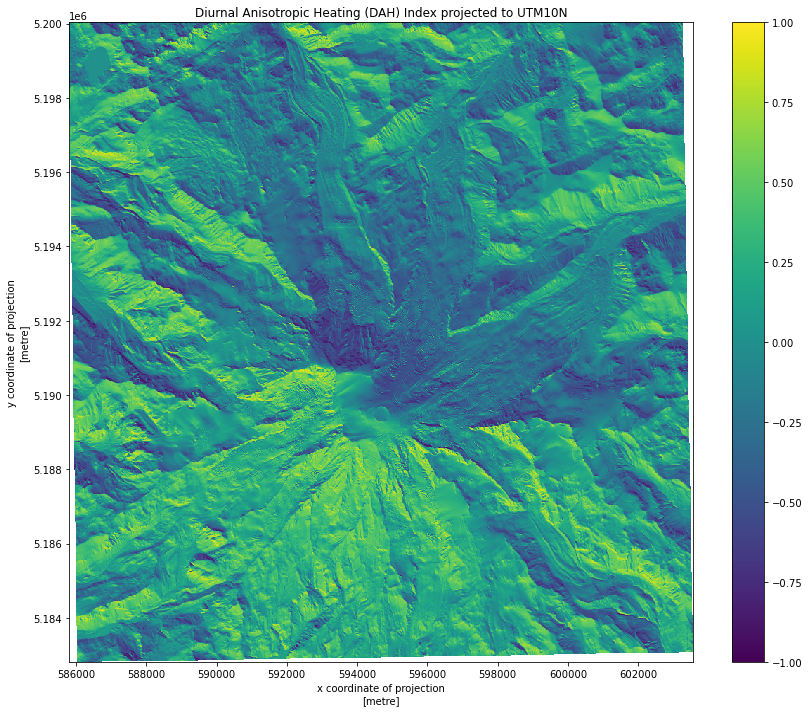

In [17]:
dah = rxr.open_rasterio('dem/diurnal_anisotropic_heating_index_rainier.tif',masked=True)
dah_projected = dah.rio.reproject_match(data_cube)
f,ax=plt.subplots(figsize=(12,10))
dah_projected.plot(vmin=-1,vmax=1)
ax.set_title('Diurnal Anisotropic Heating (DAH) Index projected to UTM10N')
plt.tight_layout()

In [18]:
dem_projected = dem_projected.assign_coords({
    "x": data_cube.x,
    "y": data_cube.y,
    "band": dem_projected.band,
})
aspect_projected = aspect_projected.assign_coords({
    "x": data_cube.x,
    "y": data_cube.y,
    "band": aspect_projected.band,
})
slope_projected = slope_projected.assign_coords({
    "x": data_cube.x,
    "y": data_cube.y,
    "band": slope_projected.band,
})
dah_projected = dah_projected.assign_coords({
    "x": data_cube.x,
    "y": data_cube.y,
    "band": dah_projected.band,
})

In [19]:
# CHECK IF CLIP CHANGES STATS
if shapefile_clip:
    dem_projected = dem_projected.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False) 
    aspect_projected = aspect_projected.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)
    slope_projected = slope_projected.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)
    dah_projected = dah_projected.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)
    runoff_dates = runoff_dates.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)
    ripening_dates = ripening_dates.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False) 

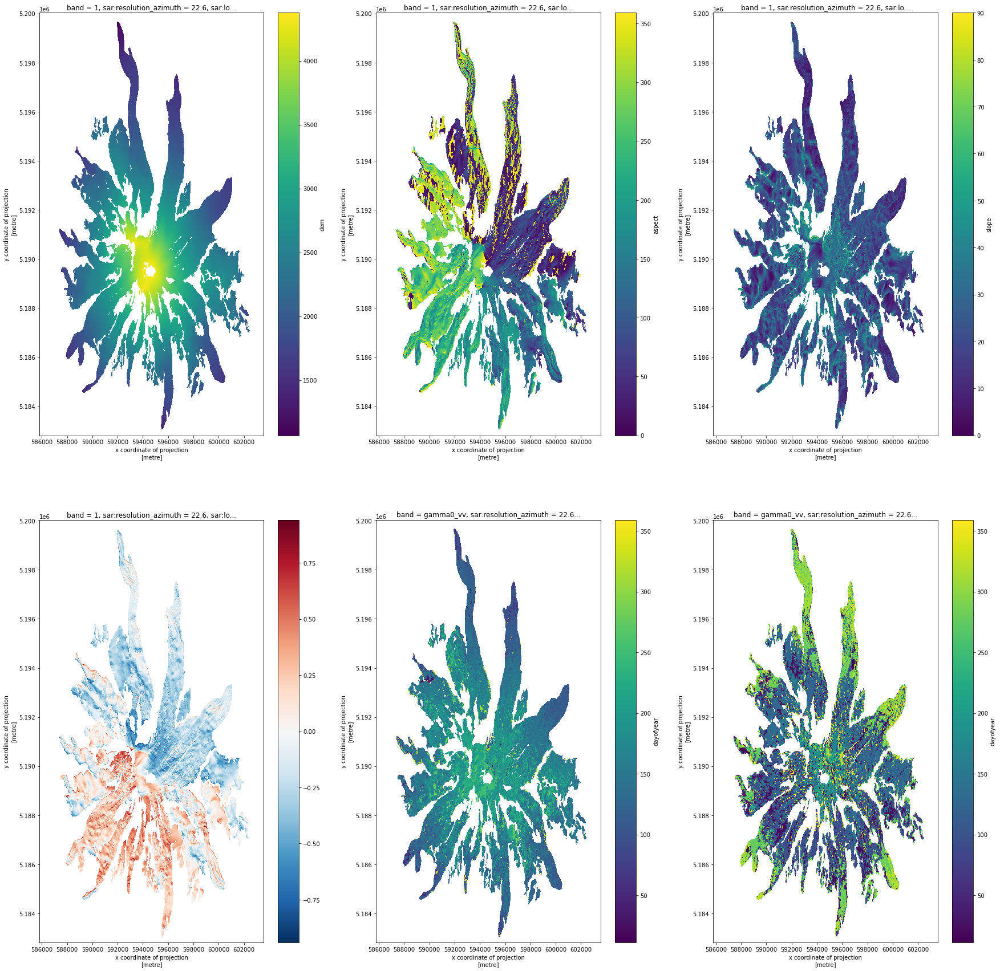

In [20]:
f,ax=plt.subplots(2,3,figsize=(30,30))
dem_projected.plot(ax=ax[0,0])
aspect_projected.plot(ax=ax[0,1],vmin=0,vmax=359)
slope_projected.plot(ax=ax[0,2],vmin=0,vmax=90)
dah_projected.plot(ax=ax[1,0])
runoff_dates.dt.dayofyear.plot(ax=ax[1,1])
ripening_dates.dt.dayofyear.plot(ax=ax[1,2])

In [21]:
dates_df = pd.DataFrame(columns=['x','y','elevation', 'aspect','aspect_rescale','dah','runoff_dates','ripening_dates'])
a1, a2 = np.meshgrid(dem_projected.indexes['x'],dem_projected.indexes['y'])
dates_df['x'] = a1.reshape(-1)
dates_df['y'] = a2.reshape(-1)
dates_df['elevation'] = dem_projected.data.reshape(-1)
dates_df['aspect'] = aspect_projected.data.reshape(-1)
dates_df['aspect_rescale'] = np.abs(aspect_projected.data.reshape(-1)-180)
dates_df['dah'] = dah_projected.data.reshape(-1)
dates_df['runoff_dates'] = runoff_dates.dt.dayofyear.data.reshape(-1)
dates_df['ripening_dates'] = ripening_dates.dt.dayofyear.data.reshape(-1)

In [22]:
dates_df

,x,y,elevation,aspect,aspect_rescale,dah,runoff_dates,ripening_dates
0,585800.0,5200020.0,NaN,NaN,NaN,NaN,NaN,NaN
1,585820.0,5200020.0,NaN,NaN,NaN,NaN,NaN,NaN
2,585840.0,5200020.0,NaN,NaN,NaN,NaN,NaN,NaN
3,585860.0,5200020.0,NaN,NaN,NaN,NaN,NaN,NaN
4,585880.0,5200020.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
765424,603480.0,5182820.0,NaN,NaN,NaN,NaN,NaN,NaN
765425,603500.0,5182820.0,NaN,NaN,NaN,NaN,NaN,NaN
765426,603520.0,5182820.0,NaN,NaN,NaN,NaN,NaN,NaN
765427,603540.0,5182820.0,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
dates_df.corr()

,x,y,elevation,aspect,aspect_rescale,dah,runoff_dates,ripening_dates
x,1.000000e+00,2.879349e-13,0.008388,-0.473670,-0.012259,-0.188956,-0.035923,0.044345
y,2.879349e-13,1.000000e+00,-0.209755,-0.039370,0.631802,-0.494930,-0.078630,0.197690
elevation,8.387983e-03,-2.097554e-01,1.000000,-0.046080,-0.118986,0.041349,0.571378,-0.179253
aspect,-4.736700e-01,-3.937011e-02,-0.046080,1.000000,-0.112073,0.356853,-0.015658,-0.019222
aspect_rescale,-1.225925e-02,6.318025e-01,-0.118986,-0.112073,1.000000,-0.848797,0.020734,0.088114
dah,-1.889556e-01,-4.949304e-01,0.041349,0.356853,-0.848797,1.000000,-0.056111,-0.071245
runoff_dates,-3.592284e-02,-7.862988e-02,0.571378,-0.015658,0.020734,-0.056111,1.000000,-0.181469
ripening_dates,4.434471e-02,1.976904e-01,-0.179253,-0.019222,0.088114,-0.071245,-0.181469,1.000000
